In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Sample data (replace with your actual data)
data_file = 'ds.csv'

# Read the data into a DataFrame
df = pd.read_csv(data_file)

# Group the data by eventID
grouped = df.groupby('eventID')

In [25]:
import json
from collections import defaultdict

# Read JSON data from file
with open('Data/OSDB.v3_Dataset_Full/dataset.json', 'r') as f:
    json_data = json.load(f)

# List to store data
event_user_data = []

# Iterate over json_data1 event
for event in json_data:
    event_id = event['id']
    user_id = event['userId']
    type = event['type']
    subType = event['subType']
    event_user_data.append({'Event ID': event_id, 'User ID': user_id, 'type':type, 'subType':subType})

# Create a DataFrame from the collected data
df = pd.DataFrame(event_user_data)

# Display the DataFrame
df.head()

,Event ID,User ID,type,subType
0,407,39,Seizure,Other
1,764,39,Seizure,Other
2,4924,39,Seizure,Other
3,5483,39,Seizure,Tonic-Clonic
4,5486,39,Seizure,Tonic-Clonic


In [6]:
# Count the number of unique types, subtypes, users, and events
num_types = df['type'].nunique()
num_subtypes = df['subType'].nunique()
num_users = df['User ID'].nunique()
num_events = df['Event ID'].nunique()

# Print the counts as strings
print("Number of unique types:", num_types)
print("Number of unique subtypes:", num_subtypes)
print("Number of unique users:", num_users)
print("Number of unique events:", num_events)


Number of unique types: 1
Number of unique subtypes: 6
Number of unique users: 18
Number of unique events: 139


In [7]:
# Count the occurrences of each subtype
subtype_counts = df['subType'].value_counts()

# Print the counts of each subtype as strings
print("Occurrences of each subtype:")
for subtype, count in subtype_counts.items():
    print(f"{subtype}: {count}")


Occurrences of each subtype:
Tonic-Clonic: 53
Other: 40
Aura: 31
: 8
null: 2
Simulation: 2


In [9]:
# Count the number of events for each user
user_event_counts = df['User ID'].value_counts().reset_index()
user_event_counts.columns = ['User ID', 'Number of Events']

# Calculate the total number of events and users
total_events = user_event_counts['Number of Events'].sum()
total_users = len(user_event_counts)

# Display the user event counts
print(user_event_counts)

# Print the total number of events and users
print(f"\nTotal number of events: {total_events}")
print(f"Total number of users: {total_users}")

    User ID  Number of Events
0        45                57
1        39                44
2       209                 8
3         8                 6
4        83                 6
5       149                 3
6        55                 2
7       236                 2
8       421                 2
9       144                 1
10      229                 1
11      465                 1
12      109                 1
13      157                 1
14       62                 1
15      467                 1
16      483                 1
17      389                 1

Total number of events: 139
Total number of users: 18


In [ ]:
import pandas as pd

# Read the CSV file into a DataFrame
df = pd.read_csv('Data/Experimental Dataset/Experimental_Dataset.csv')

# Group by 'eventID' and count occurrences
event_count = df.groupby('eventID').size().reset_index(name='count')

print(event_count)


In [ ]:
import pandas as pd

# Read the CSV file into a DataFrame

# Group by 'eventID' and count occurrences
event_count = df.groupby('eventID').size().reset_index(name='count')

# Add a new column that multiplies the 'count' column by 5
event_count['count_times_5'] = event_count['count'].apply(lambda x: x * 5)

 

In [18]:
# Group by 'eventID' and count occurrences
event_count = df.groupby('eventID').size().reset_index(name='count')

# Calculate total number of events
total_events = len(event_count)

# Calculate total number of counts
total_counts = event_count['count'].sum()

# Add a new column that multiplies the 'count' column by 5
event_count['count_times_5'] = event_count['count'] * 5

# Calculate total count times 5
total_count_times_5 = event_count['count_times_5'].sum()

# Convert total count times 5 to formatted unit of time (hh:mm:ss)
total_time_seconds = total_count_times_5
hours = total_time_seconds // 3600
minutes = (total_time_seconds % 3600) // 60
seconds = total_time_seconds % 60
formatted_time = '{:02}:{:02}:{:02}'.format(int(hours), int(minutes), int(seconds))

# Display results
print("Total number of events:", total_events)
print("Total number of counts:", total_counts)
print("Total count times 5 formatted as time (hh:mm:ss):", formatted_time)

Total number of events: 139
Total number of counts: 3949
Total count times 5 formatted as time (hh:mm:ss): 05:29:05


In [19]:
## Sample data (replace with your actual data)
data_file = 'transposed_data_with_h1r.csv'

# Read the data into a DataFrame
df = pd.read_csv(data_file)
# Count the number of unique eventIDs
unique_eventIDs_count = df['eventID'].nunique()
print("Number of unique eventIDs:", unique_eventIDs_count)

Number of unique eventIDs: 106


In [20]:
import pandas as pd

# Load the CSV file into a DataFrame
df = pd.read_csv("base_dataset_1.csv")

# List of eventIDs to remove
eventIDs_to_remove = [764, 1046, 5721, 5745, 5891, 6587, 6590, 6808, 7006, 7434,
                      8998, 9005, 12206, 14101, 15208, 15230, 15417, 17219, 21603,
                      21855, 21867, 26071, 26987,26988, 27786, 28734, 31397, 31402, 31404,
                      36799, 36872, 44115, 45208, 45795, 45800, 47173]

# Sort the DataFrame by columns defining the sequential order
df_sorted = df.sort_values(by=['eventID', 'hr'])

# Remove rows with eventIDs in the list while maintaining the sequential order
filtered_df = df_sorted[~df_sorted['eventID'].isin(eventIDs_to_remove)]

# Save the filtered DataFrame to a new CSV file
filtered_df.to_csv("base_dataset_4.csv", index=False)


In [21]:
# Count the number of unique event IDs
num_unique_event_ids = new_df['eventID'].nunique()
print("Number of unique event IDs:", num_unique_event_ids)

Number of unique event IDs: 139


In [23]:
import pandas as pd

# List of eventIDs to remove
eventIDs_to_remove = [764, 1046, 5721, 5745, 5891, 6587, 6590, 6808, 7006, 7434,
                      8998, 9005, 12206, 14101, 15208, 15230, 15417, 17219, 21603,
                      21855, 21867, 26071, 26987, 27786, 28734, 31397, 31402, 31404,
                      36799, 3682, 44115, 45208, 45795, 45800, 47173]

eventIDs_to_remove =[764, 1046, 5721, 5745, 5891, 6587, 6590, 6808, 7006, 7434,
                      8998, 9005, 12206, 14101, 15208, 15230, 15417, 17219, 21603,
                      21855, 21867, 26071, 26987, 27786, 28734, 31397, 31402, 31404,
                      36799, 3682, 44115, 45208, 45795, 45800, 47173]

# Load the original CSV file
df = pd.read_csv('ds1.csv')

# Drop two columns from the DataFrame
df.drop(['max_acceleration', 'std_deviation'], axis=1, inplace=True)

# Remove rows with eventIDs in the list
new_df = df[~df['eventID'].isin(eventIDs_to_remove)]

# Sort the DataFrame by 'eventID' column in ascending order
new_df = new_df.sort_values(by='eventID', ascending=True)

# Transpose hr and rawData values
repeated_rows = new_df.reindex(new_df.index.repeat(125))

# Reset index to match the length of repeated rows
repeated_rows.reset_index(drop=True, inplace=True)

# Split and expand rawData values
rawData_expanded = new_df['rawData'].str.strip('][').str.split(', ', expand=True)

# Concatenate the repeated DataFrame and expanded rawData DataFrame
transposed_df = pd.concat([repeated_rows, rawData_expanded], axis=1)

# Rename the columns
transposed_df.columns = ['eventID', 'hr', 'label'] + [f'rawData_{i}' for i in range(rawData_expanded.shape[1])]

# Save the new DataFrame to a new CSV file
transposed_df.to_csv('transposed_data_with_hr.csv', index=False)

ValueError: Length mismatch: Expected axis has 129 elements, new values have 128 elements

In [11]:
import pandas as pd
import numpy as np

# Load the original CSV file
df = pd.read_csv('ds1.csv')

# Drop two columns from the DataFrame
df.drop(['max_acceleration', 'std_deviation'], axis=1, inplace=True)

# List of eventIDs to remove
eventIDs_to_remove = [764, 1046, 5721, 5745, 5891, 6587, 6590, 6808, 7006, 7434,
                      8998, 9005, 12206, 14101, 15208, 15230, 15417, 17219, 21603,
                      21855, 21867, 26071, 26987, 27786, 28734, 31397, 31402, 31404,
                      36799, 3682, 44115, 45208, 45795, 45800, 47173]

# Remove rows with eventIDs in the list
new_df = df[~df['eventID'].isin(eventIDs_to_remove)]

# Sort the DataFrame by 'eventID' column in ascending order
new_df = new_df.sort_values(by='eventID', ascending=True)

# Repeat each row of the DataFrame 125 times
repeated_rows = new_df.loc[new_df.index.repeat(125)].reset_index(drop=True)

# Reshape the 'rawData' column into a single column
rawData_expanded = new_df['rawData'].str.strip('[]').str.split(', ', expand=True).astype(float)
rawData_expanded = rawData_expanded.stack().reset_index(level=1, drop=True).rename('rawData')

# Repeat the 'hr' column values
repeated_hr = new_df['hr'].repeat(125).reset_index(drop=True).rename('hr')

# Reset indices for all DataFrames
repeated_rows.reset_index(drop=True, inplace=True)
rawData_expanded.reset_index(drop=True, inplace=True)
repeated_hr.reset_index(drop=True, inplace=True)

# Concatenate the repeated rows with the reshaped 'rawData' and 'hr' columns
result_df = pd.concat([repeated_rows[['eventID', 'label']], repeated_hr, rawData_expanded], axis=1)

# Save the new DataFrame to a new CSV file
result_df.to_csv('transposed_data_with_h1r.csv', index=False)


In [ ]:
import pandas as pd
import ast

# Load the CSV file into a DataFrame
df = pd.read_csv("ds.csv")

# Convert the "rawData" column from string representation of list to actual list
df['rawData'] = df['rawData'].apply(ast.literal_eval)

# Drop the columns "max_acceleration" and "std_deviation"
df = df.drop(columns=["max_acceleration", "std_deviation"])

# Explode the "rawData" column to expand the lists
reshaped_df = df.explode('rawData')

# Rename columns for consistency
reshaped_df = reshaped_df.rename(columns={'Id':'Id', 'eventID': 'eventId', 'hr': 'Hr'})

# List of eventIDs to remove
eventIDs_to_remove = [764, 1046, 5721, 5745, 5891, 6587, 6590, 6808, 7006, 7434,
                      8998, 9005, 12206, 14101, 15208, 15230, 15417, 17219, 21603,
                      21855, 21867, 26071, 26987, 27786, 28734, 31397, 31402, 31404,
                      36799, 3682, 44115, 45208, 45795, 45800, 47173]

# Remove rows with eventIDs in the list
new_df = reshaped_df[~reshaped_df['eventId'].isin(eventIDs_to_remove)]

# Save the filtered DataFrame to a new CSV file
new_df.to_csv("epx2_dataset.csv", index=False)


In [ ]:
import pandas as pd
import os

# Sample data file
data_file = 'formatted_labels.csv'

# Read the data into a DataFrame
df = pd.read_csv(data_file, sep='\t', header=None)

# Create the annotations directory if it doesn't exist
annotations_dir = 'Annotations7'
os.makedirs(annotations_dir, exist_ok=True)

# Iterate through each row in the DataFrame
for index, row in df.iterrows():
    # Get the eventID from the first value in the row
    eventID = int(row.iloc[0])
    
    # Get the row values from the second column onwards
    row_values = row.iloc[1:].dropna()  # Drop any NaN values
    
    # Transpose the row values into a single column DataFrame
    transposed_df = pd.DataFrame(row_values, columns=['values'])
    
    # Save the transposed DataFrame to a text file with the eventID as the filename
    file_path = os.path.join(annotations_dir, f"{eventID}.txt")
    transposed_df.to_csv(file_path, header=None, index=None)

print("Files generated successfully.")


In [24]:
from scipy.interpolate import CubicSpline

# Plot acceleration rawData and heart rate for each Aura eventID
for event in data:
    eventID = event['id']
    event_type = event['type']
    event_subtype = event['subType']
    
    # Check if the event subtype is "Aura"
    if event_subtype == "Tonic-clonic":
        plt.figure(figsize=(15, 6))
        ax1 = plt.gca()  # Get the current axes
        ax2 = ax1.twinx()  # Create a secondary y-axis sharing the same x-axis

        # Initialize x-axis time values and heart rate values
        time_offset = 0
        combined_data = np.array([])
        heart_rates = []

        for i, datapoint in enumerate(event['datapoints']):
            # Extract acceleration data from rawData
            acceleration_data = np.array(datapoint['rawData'])
            # Append the acceleration data to the combined data
            combined_data = np.concatenate((combined_data, acceleration_data))
            # Extract heart rate data
            heart_rate = datapoint['hr']
            heart_rates.append(heart_rate)

        # Calculate time array based on the length of combined data
        time = np.arange(len(combined_data)) / 125 * 5

        # Linearly interpolate heart rate data to generate 125 evenly spaced values
        linear_interp_hr = interp1d(np.linspace(0, 1, num=len(heart_rates)), heart_rates, kind='linear')

        # Generate new time array for interpolated data
        new_time = np.linspace(0, 1, num=125)  # 125 points for the whole sequence

        # Apply cubic spline interpolation to smooth the linearly interpolated heart rate values
        # Define the number of knots for the spline
        num_knots = 5  # Adjust this value to increase or decrease the smoothness

        # Create the cubic spline function with the specified number of knots
        cubic_spline_hr = CubicSpline(new_time, linear_interp_hr(new_time), bc_type='clamped', extrapolate=True)

        # Plot interpolated acceleration data
        ax1.plot(time, combined_data, label=f'Event {eventID} Acceleration', color='tab:blue')
        ax1.set_xlabel('Time (Seconds)', fontsize=16)
        ax1.set_ylabel('Acceleration (~milli-g)', fontsize=16)

        # Plot interpolated heart rate data on the secondary y-axis
        ax2.plot(time, cubic_spline_hr(np.linspace(0, 1, num=len(combined_data))), label=f'Event {eventID} Heart Rate', color='tab:orange')
        ax2.set_ylabel('Heart Rate', fontsize=16)

        # Combine the legends for both plots
        lines, labels = ax1.get_legend_handles_labels()
        lines2, labels2 = ax2.get_legend_handles_labels()
        ax2.legend(lines + lines2, labels + labels2, loc='upper right', fontsize=12)

        plt.title(f'Event {eventID}, Subtype = {event_subtype}', fontsize=18)
        plt.grid(True)
        plt.show()

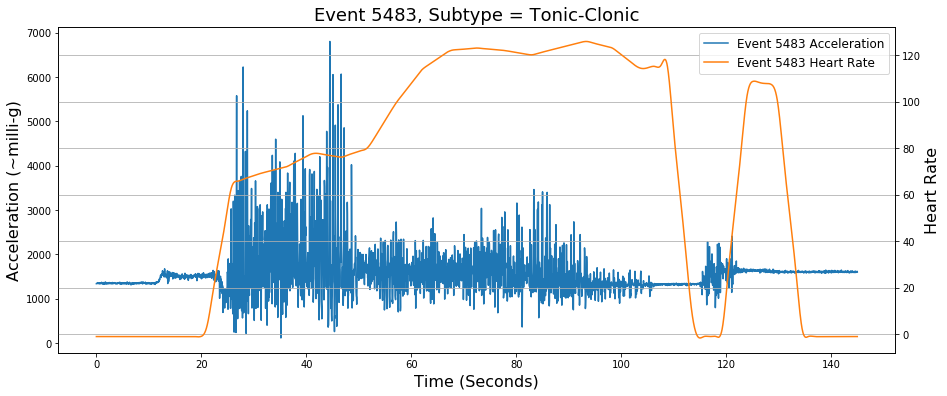

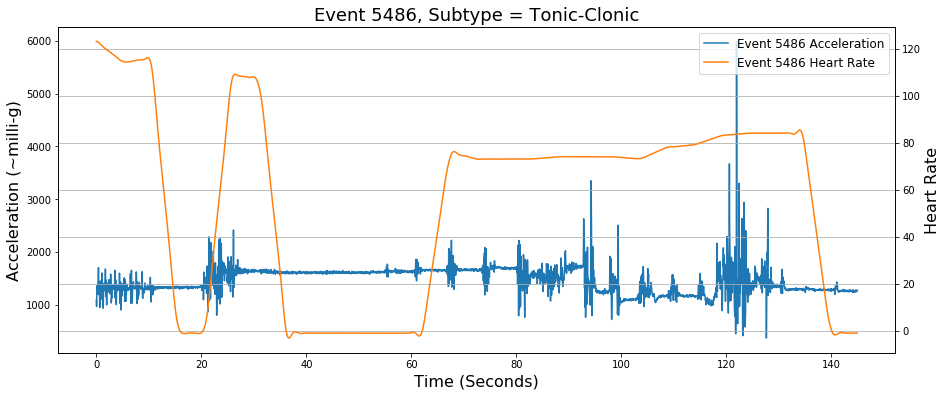

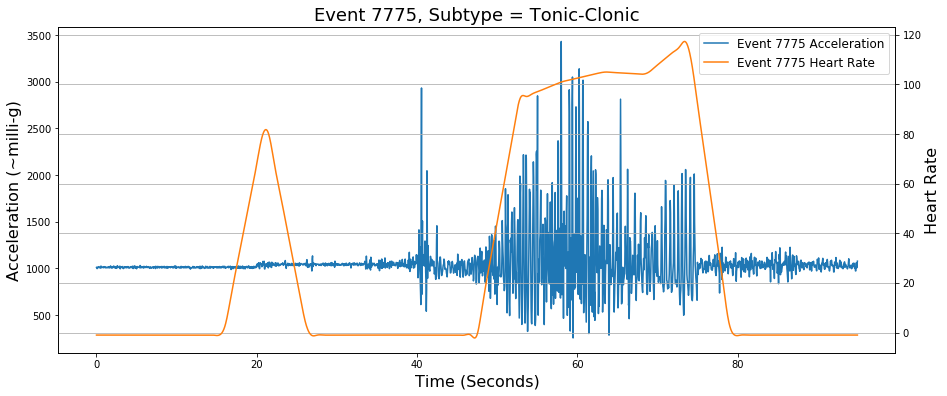

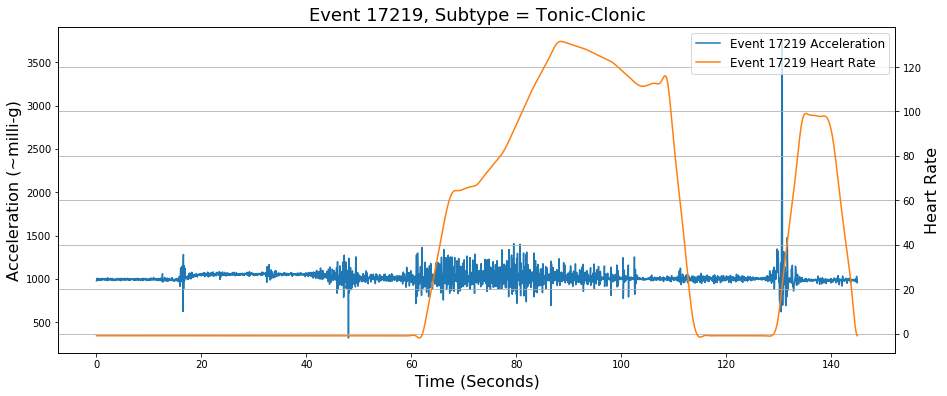

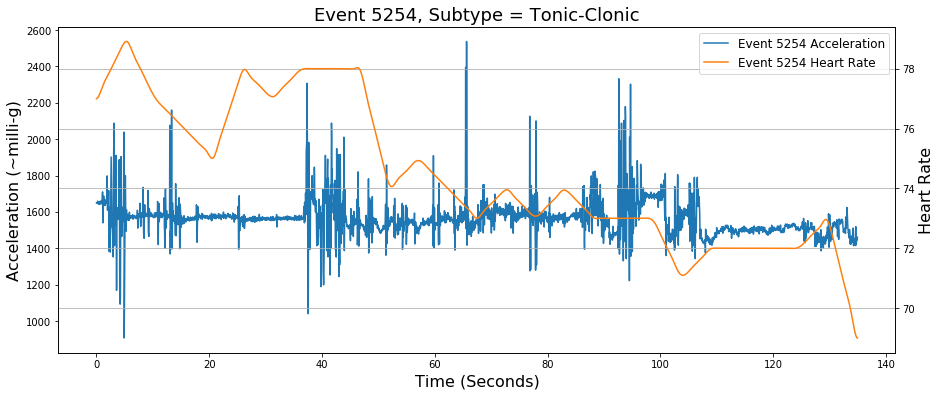

...

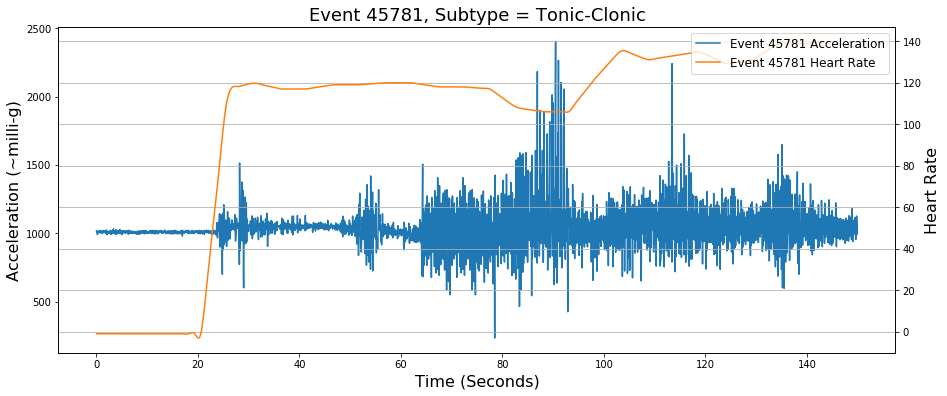

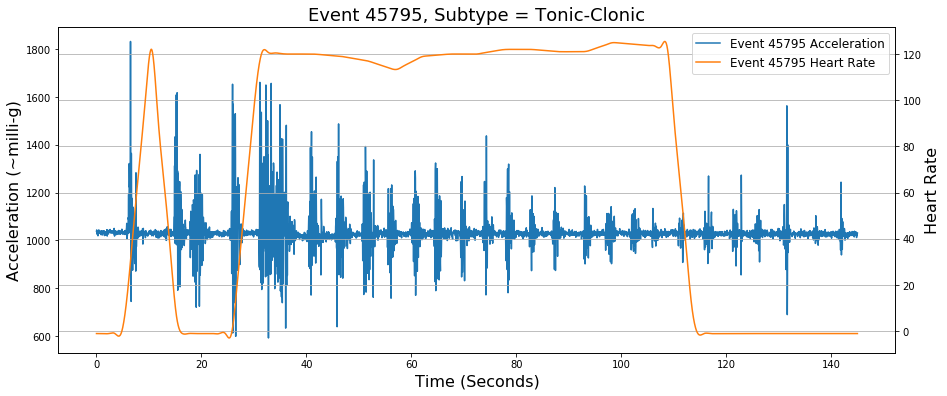

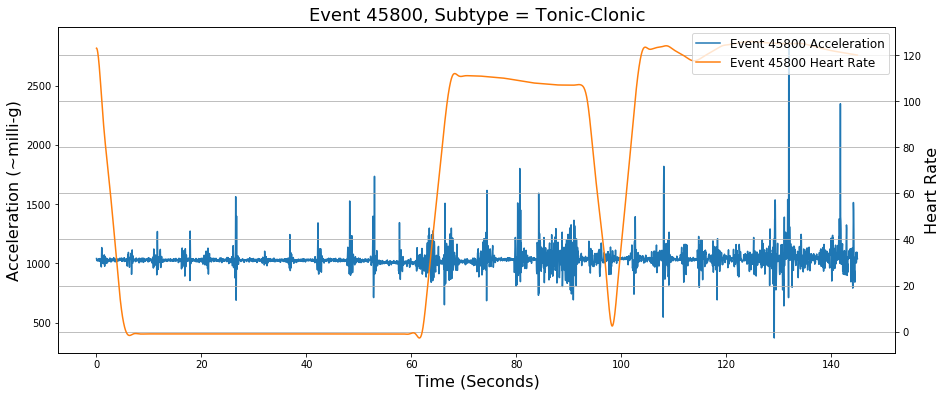

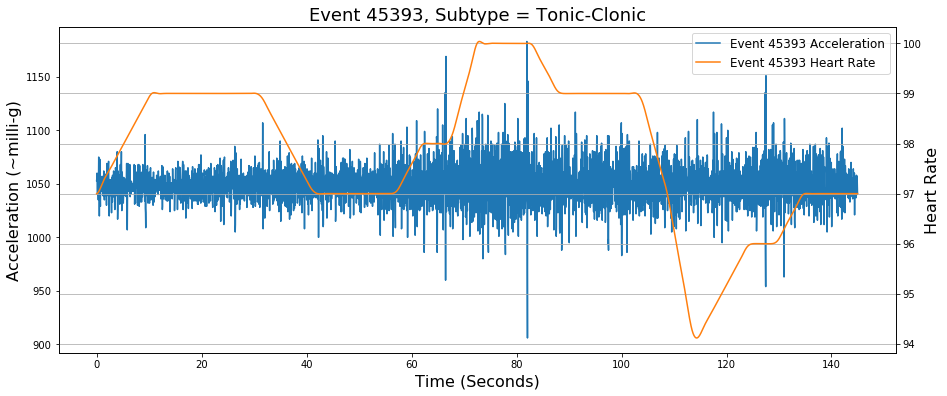

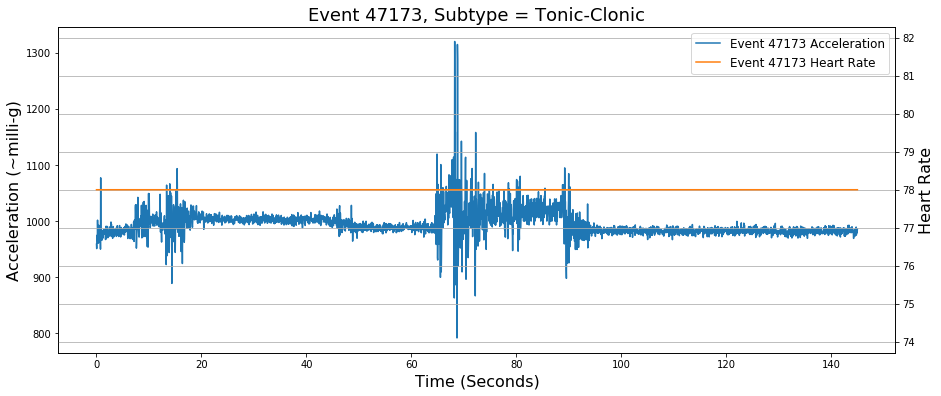

In [26]:
from scipy.interpolate import CubicSpline
from scipy.interpolate import interp1d

# Plot acceleration rawData and heart rate for each Aura eventID
for event in data:
    eventID = event['id']
    event_type = event['type']
    event_subtype = event['subType']
    
    # Check if the event subtype is "Aura"
    if event_subtype == "Tonic-Clonic":
        plt.figure(figsize=(15, 6))
        ax1 = plt.gca()  # Get the current axes
        ax2 = ax1.twinx()  # Create a secondary y-axis sharing the same x-axis

        # Initialize x-axis time values and heart rate values
        time_offset = 0
        combined_data = np.array([])
        heart_rates = []

        for i, datapoint in enumerate(event['datapoints']):
            # Extract acceleration data from rawData
            acceleration_data = np.array(datapoint['rawData'])
            # Append the acceleration data to the combined data
            combined_data = np.concatenate((combined_data, acceleration_data))
            # Extract heart rate data
            heart_rate = datapoint['hr']
            heart_rates.append(heart_rate)

        # Calculate time array based on the length of combined data
        time = np.arange(len(combined_data)) / 125 * 5

        # Linearly interpolate heart rate data to generate 125 evenly spaced values
        linear_interp_hr = interp1d(np.linspace(0, 1, num=len(heart_rates)), heart_rates, kind='linear')

        # Generate new time array for interpolated data
        new_time = np.linspace(0, 1, num=125)  # 125 points for the whole sequence

        # Apply cubic spline interpolation to smooth the linearly interpolated heart rate values
        # Define the number of knots for the spline
        num_knots = 5  # Adjust this value to increase or decrease the smoothness

        # Create the cubic spline function with the specified number of knots
        cubic_spline_hr = CubicSpline(new_time, linear_interp_hr(new_time), bc_type='clamped', extrapolate=True)

        # Plot interpolated acceleration data
        ax1.plot(time, combined_data, label=f'Event {eventID} Acceleration', color='tab:blue')
        ax1.set_xlabel('Time (Seconds)', fontsize=16)
        ax1.set_ylabel('Acceleration (~milli-g)', fontsize=16)

        # Plot interpolated heart rate data on the secondary y-axis
        ax2.plot(time, cubic_spline_hr(np.linspace(0, 1, num=len(combined_data))), label=f'Event {eventID} Heart Rate', color='tab:orange')
        ax2.set_ylabel('Heart Rate', fontsize=16)

        # Combine the legends for both plots
        lines, labels = ax1.get_legend_handles_labels()
        lines2, labels2 = ax2.get_legend_handles_labels()
        ax2.legend(lines + lines2, labels + labels2, loc='upper right', fontsize=12)

        plt.title(f'Event {eventID}, Subtype = {event_subtype}', fontsize=18)
        plt.grid(True)
        plt.show()


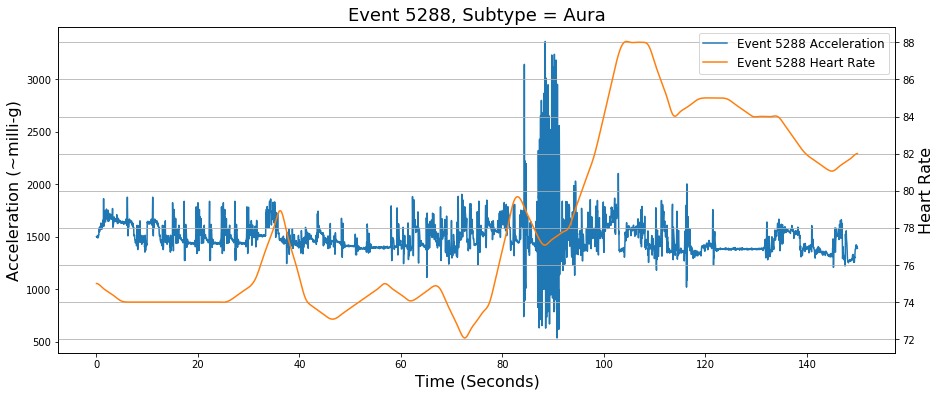

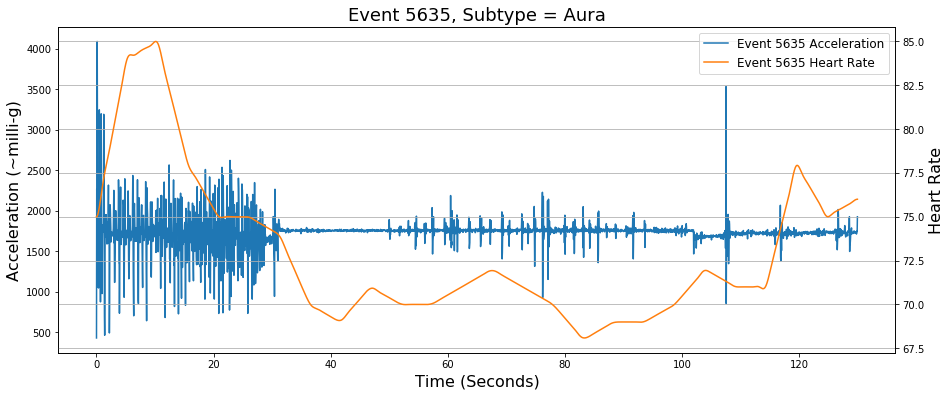

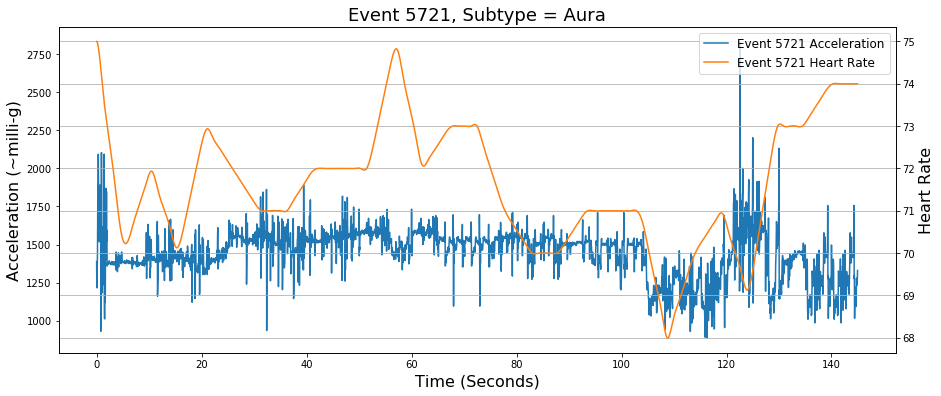

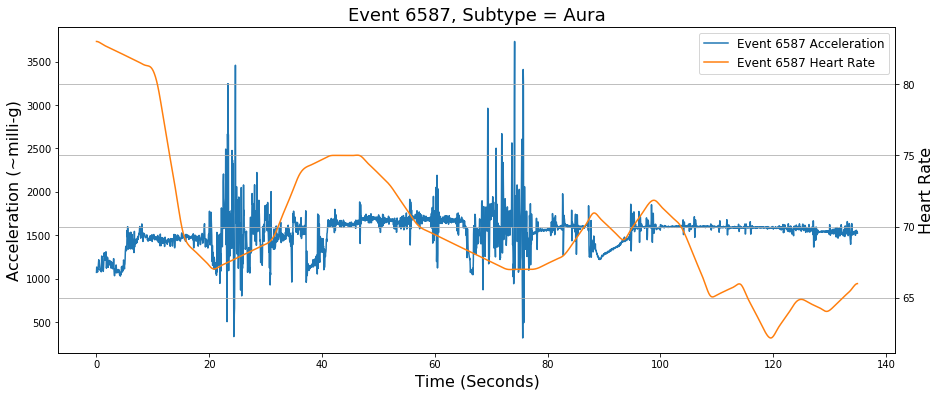

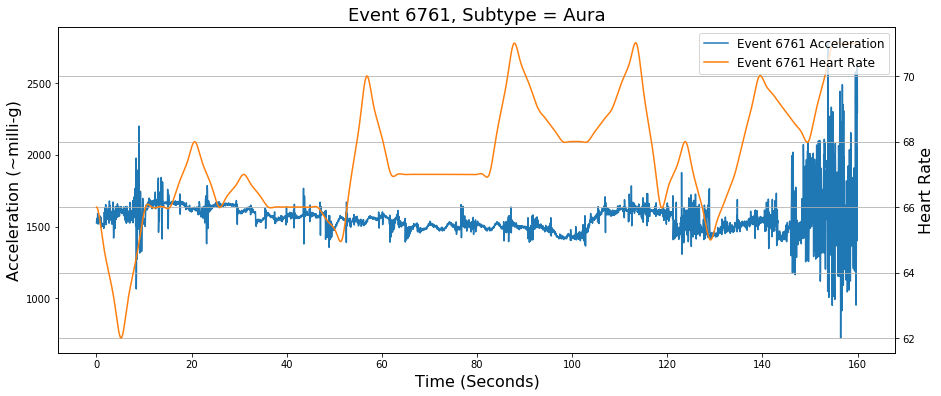

...

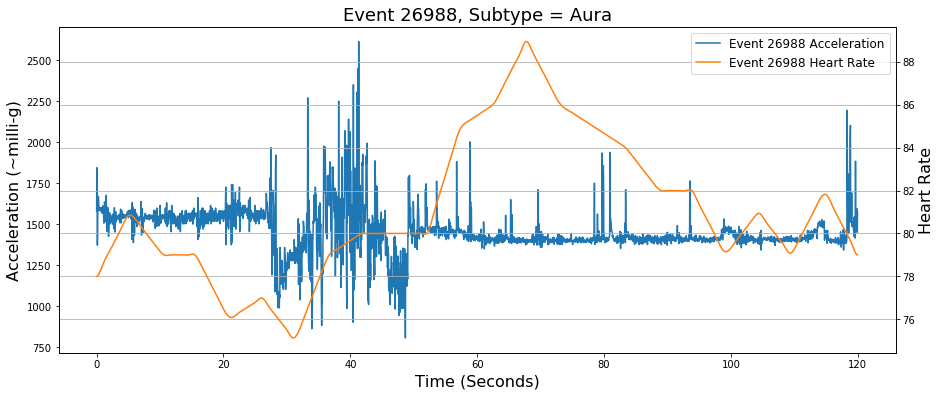

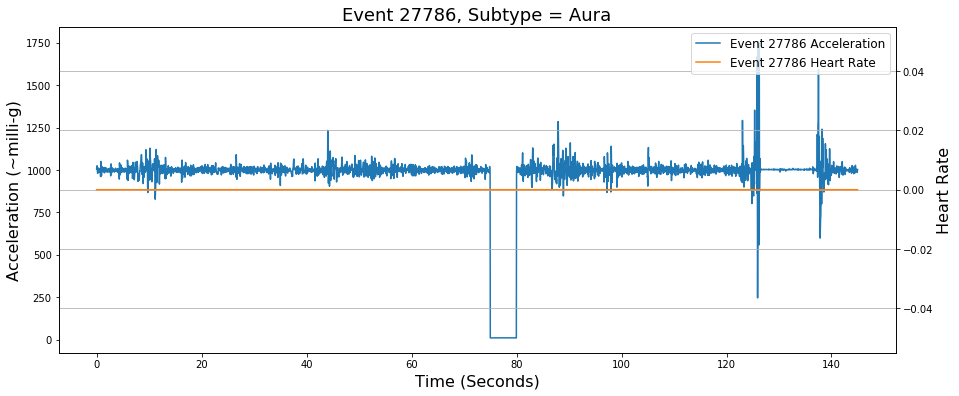

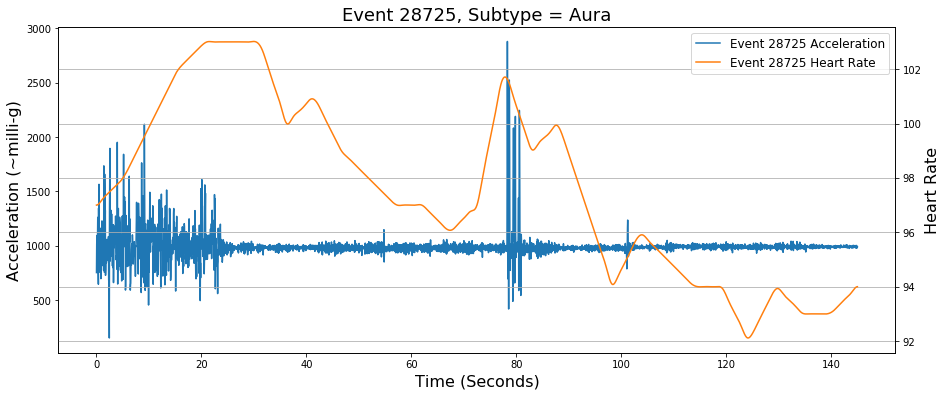

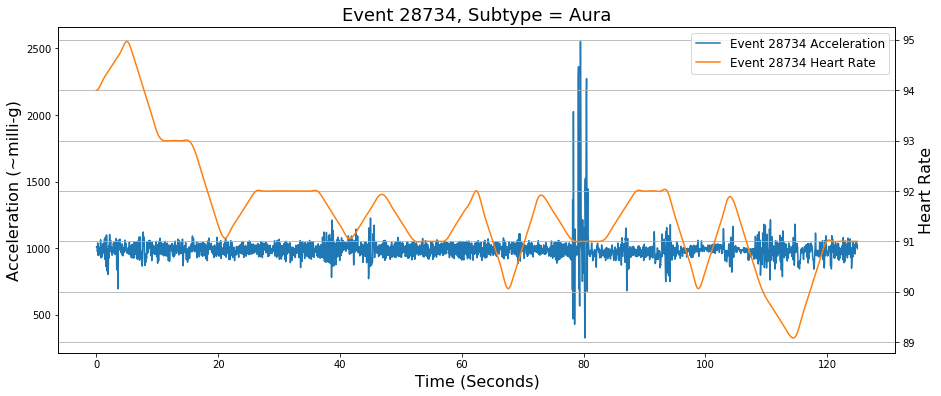

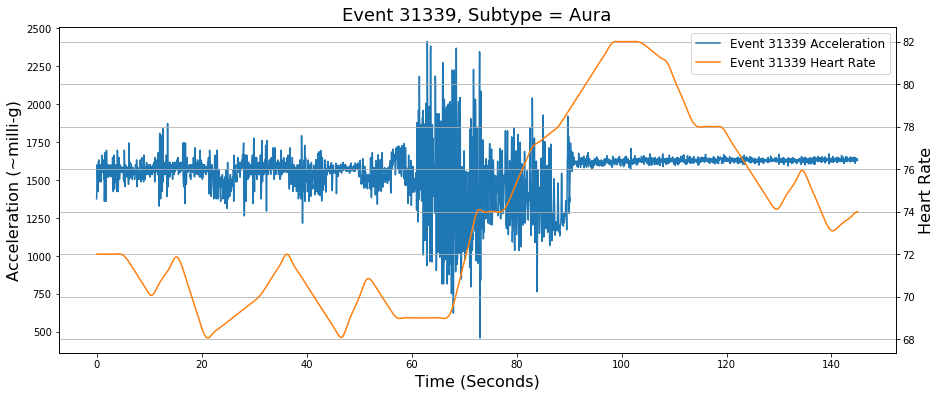

In [27]:
from scipy.interpolate import CubicSpline
from scipy.interpolate import interp1d

# Plot acceleration rawData and heart rate for each Aura eventID
for event in data:
    eventID = event['id']
    event_type = event['type']
    event_subtype = event['subType']
    
    # Check if the event subtype is "Aura"
    if event_subtype == "Aura":
        plt.figure(figsize=(15, 6))
        ax1 = plt.gca()  # Get the current axes
        ax2 = ax1.twinx()  # Create a secondary y-axis sharing the same x-axis

        # Initialize x-axis time values and heart rate values
        time_offset = 0
        combined_data = np.array([])
        heart_rates = []

        for i, datapoint in enumerate(event['datapoints']):
            # Extract acceleration data from rawData
            acceleration_data = np.array(datapoint['rawData'])
            # Append the acceleration data to the combined data
            combined_data = np.concatenate((combined_data, acceleration_data))
            # Extract heart rate data
            heart_rate = datapoint['hr']
            heart_rates.append(heart_rate)

        # Calculate time array based on the length of combined data
        time = np.arange(len(combined_data)) / 125 * 5

        # Linearly interpolate heart rate data to generate 125 evenly spaced values
        linear_interp_hr = interp1d(np.linspace(0, 1, num=len(heart_rates)), heart_rates, kind='linear')

        # Generate new time array for interpolated data
        new_time = np.linspace(0, 1, num=125)  # 125 points for the whole sequence

        # Apply cubic spline interpolation to smooth the linearly interpolated heart rate values
        # Define the number of knots for the spline
        num_knots = 5  # Adjust this value to increase or decrease the smoothness

        # Create the cubic spline function with the specified number of knots
        cubic_spline_hr = CubicSpline(new_time, linear_interp_hr(new_time), bc_type='clamped', extrapolate=True)

        # Plot interpolated acceleration data
        ax1.plot(time, combined_data, label=f'Event {eventID} Acceleration', color='tab:blue')
        ax1.set_xlabel('Time (Seconds)', fontsize=16)
        ax1.set_ylabel('Acceleration (~milli-g)', fontsize=16)

        # Plot interpolated heart rate data on the secondary y-axis
        ax2.plot(time, cubic_spline_hr(np.linspace(0, 1, num=len(combined_data))), label=f'Event {eventID} Heart Rate', color='tab:orange')
        ax2.set_ylabel('Heart Rate', fontsize=16)

        # Combine the legends for both plots
        lines, labels = ax1.get_legend_handles_labels()
        lines2, labels2 = ax2.get_legend_handles_labels()
        ax2.legend(lines + lines2, labels + labels2, loc='upper right', fontsize=12)

        plt.title(f'Event {eventID}, Subtype = {event_subtype}', fontsize=18)
        plt.grid(True)
        plt.show()


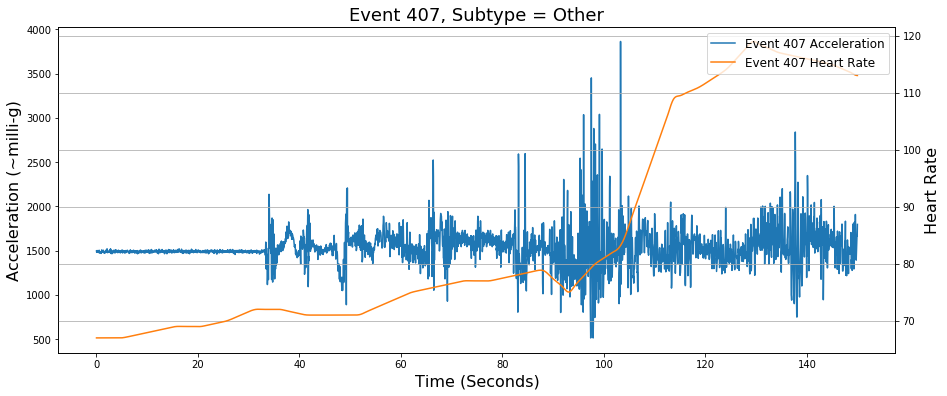

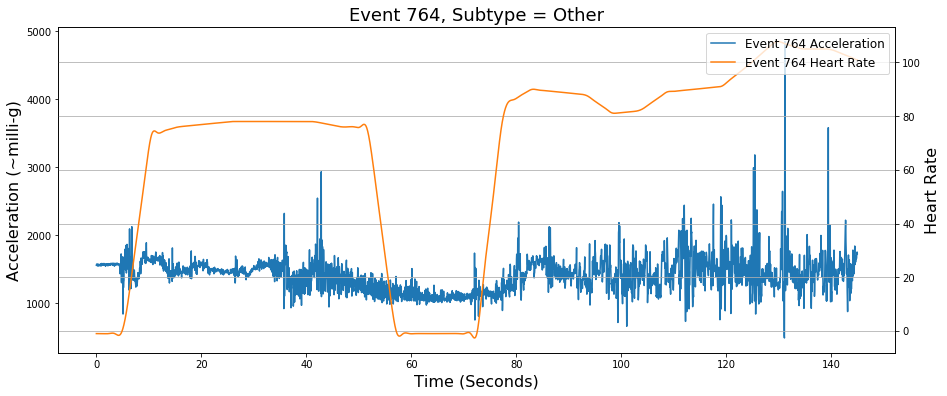

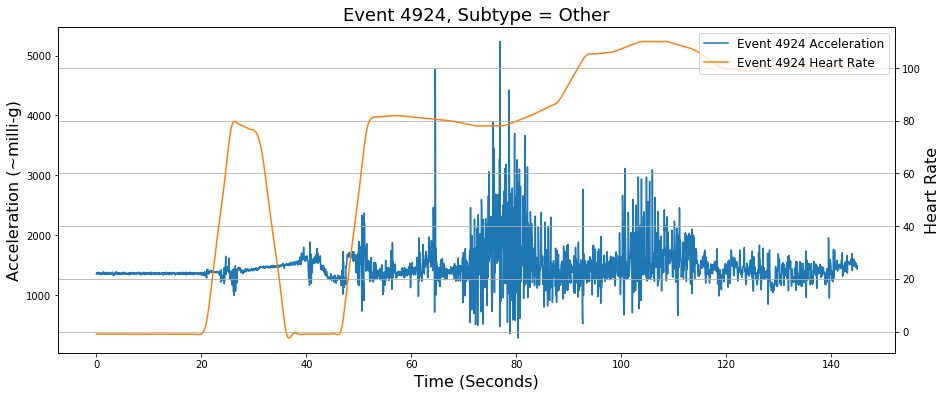

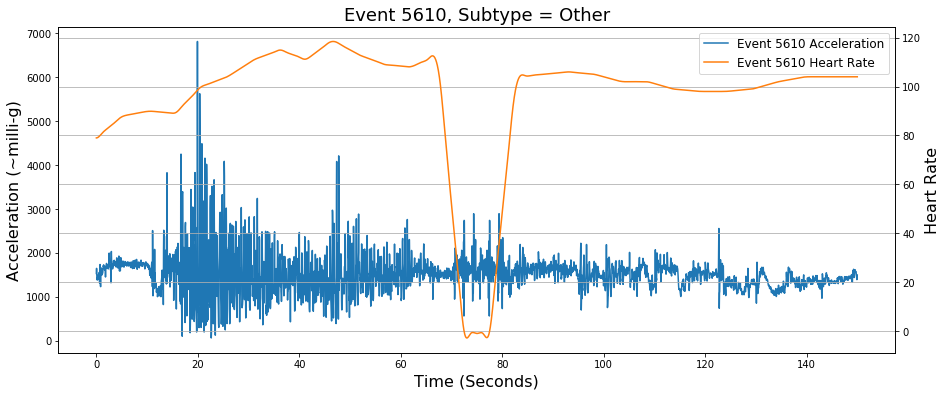

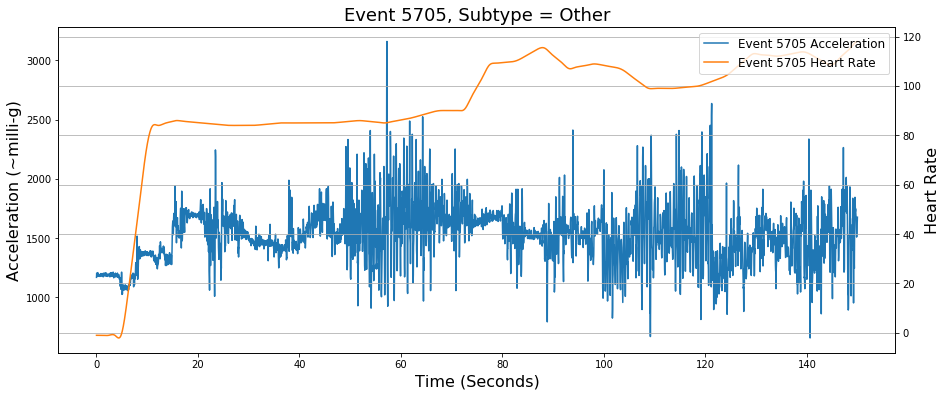

...

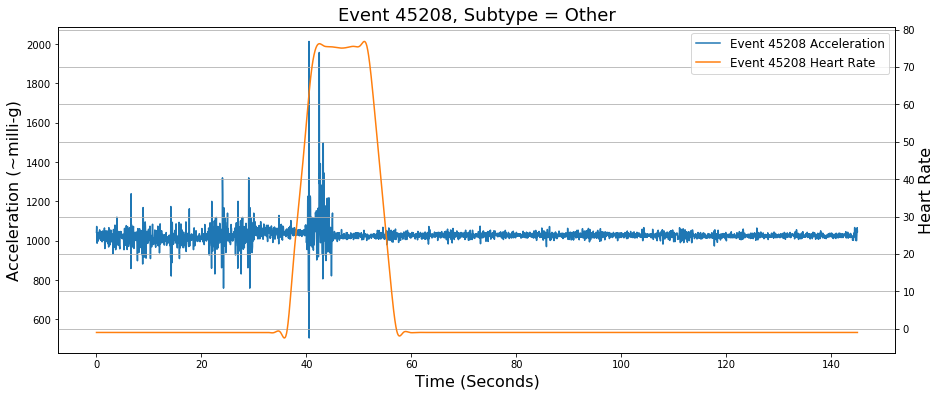

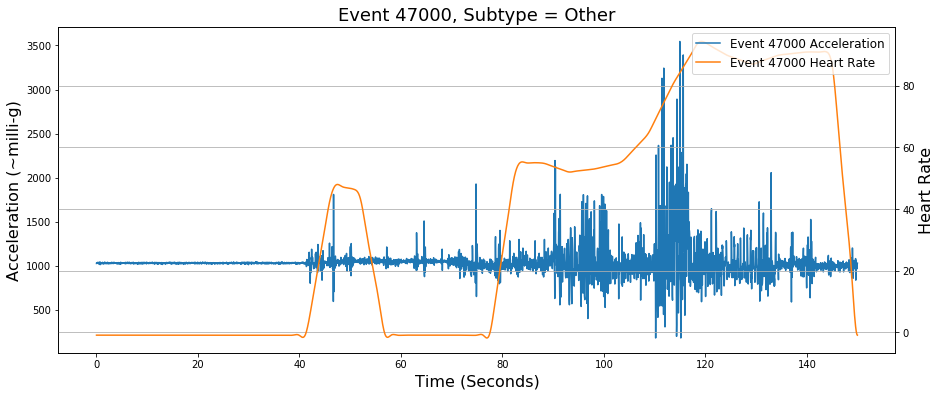

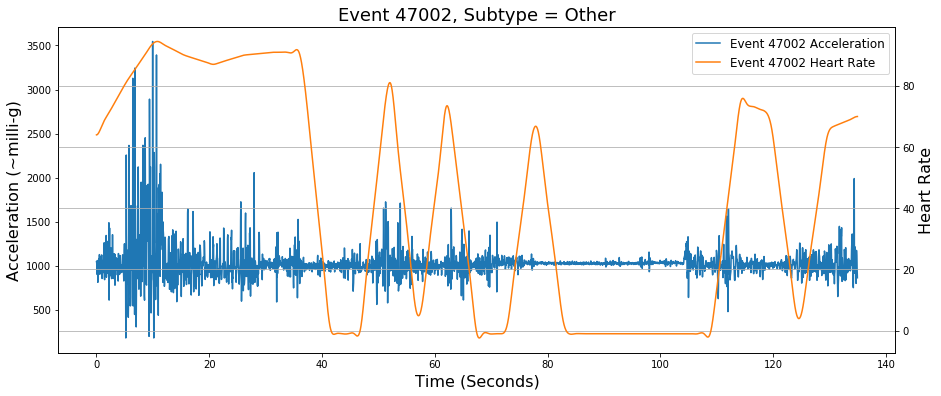

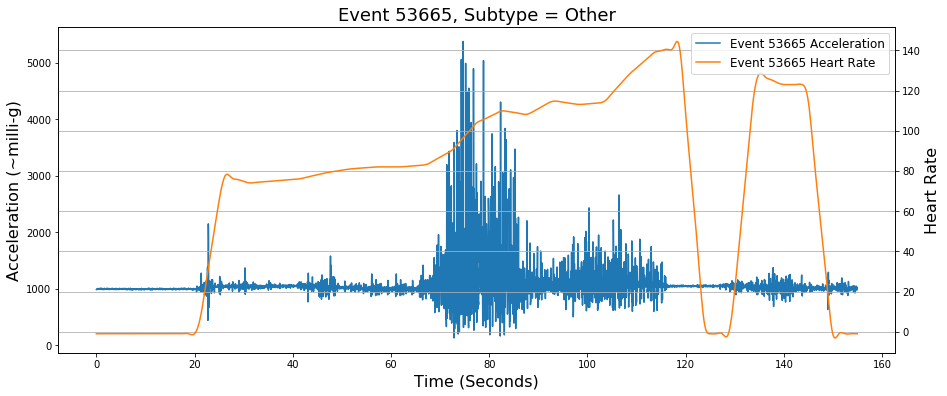

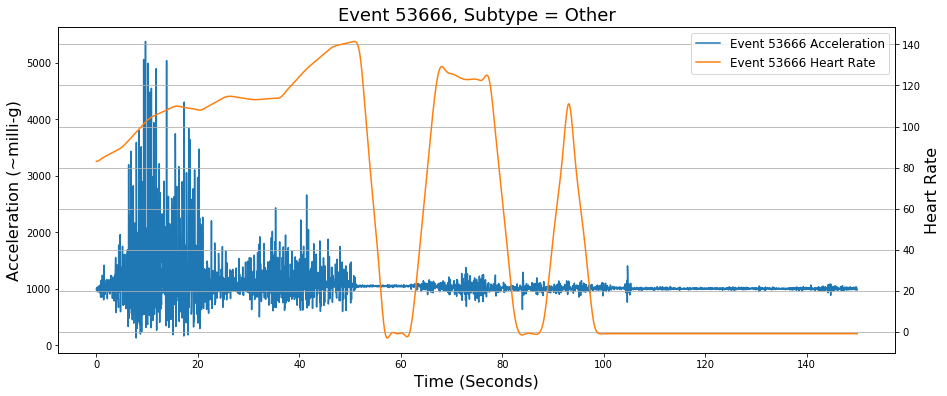

In [28]:
from scipy.interpolate import CubicSpline
from scipy.interpolate import interp1d

# Plot acceleration rawData and heart rate for each Aura eventID
for event in data:
    eventID = event['id']
    event_type = event['type']
    event_subtype = event['subType']
    
    # Check if the event subtype is "Aura"
    if event_subtype == "Other":
        plt.figure(figsize=(15, 6))
        ax1 = plt.gca()  # Get the current axes
        ax2 = ax1.twinx()  # Create a secondary y-axis sharing the same x-axis

        # Initialize x-axis time values and heart rate values
        time_offset = 0
        combined_data = np.array([])
        heart_rates = []

        for i, datapoint in enumerate(event['datapoints']):
            # Extract acceleration data from rawData
            acceleration_data = np.array(datapoint['rawData'])
            # Append the acceleration data to the combined data
            combined_data = np.concatenate((combined_data, acceleration_data))
            # Extract heart rate data
            heart_rate = datapoint['hr']
            heart_rates.append(heart_rate)

        # Calculate time array based on the length of combined data
        time = np.arange(len(combined_data)) / 125 * 5

        # Linearly interpolate heart rate data to generate 125 evenly spaced values
        linear_interp_hr = interp1d(np.linspace(0, 1, num=len(heart_rates)), heart_rates, kind='linear')

        # Generate new time array for interpolated data
        new_time = np.linspace(0, 1, num=125)  # 125 points for the whole sequence

        # Apply cubic spline interpolation to smooth the linearly interpolated heart rate values
        # Define the number of knots for the spline
        num_knots = 5  # Adjust this value to increase or decrease the smoothness

        # Create the cubic spline function with the specified number of knots
        cubic_spline_hr = CubicSpline(new_time, linear_interp_hr(new_time), bc_type='clamped', extrapolate=True)

        # Plot interpolated acceleration data
        ax1.plot(time, combined_data, label=f'Event {eventID} Acceleration', color='tab:blue')
        ax1.set_xlabel('Time (Seconds)', fontsize=16)
        ax1.set_ylabel('Acceleration (~milli-g)', fontsize=16)

        # Plot interpolated heart rate data on the secondary y-axis
        ax2.plot(time, cubic_spline_hr(np.linspace(0, 1, num=len(combined_data))), label=f'Event {eventID} Heart Rate', color='tab:orange')
        ax2.set_ylabel('Heart Rate', fontsize=16)

        # Combine the legends for both plots
        lines, labels = ax1.get_legend_handles_labels()
        lines2, labels2 = ax2.get_legend_handles_labels()
        ax2.legend(lines + lines2, labels + labels2, loc='upper right', fontsize=12)

        plt.title(f'Event {eventID}, Subtype = {event_subtype}', fontsize=18)
        plt.grid(True)
        plt.show()


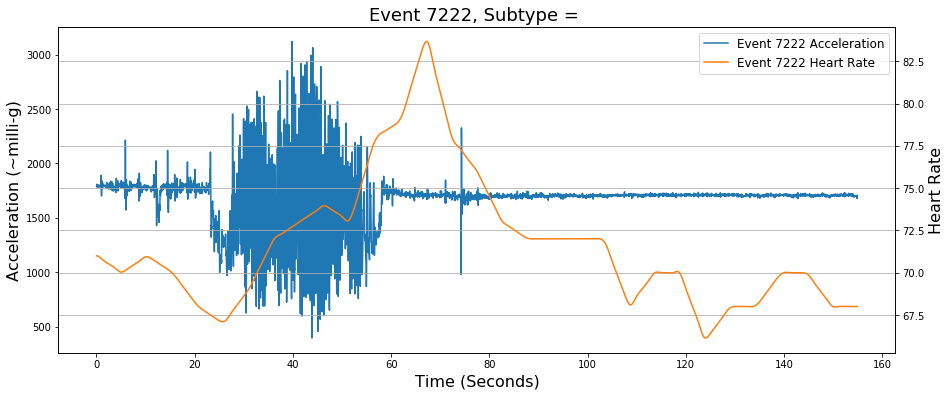

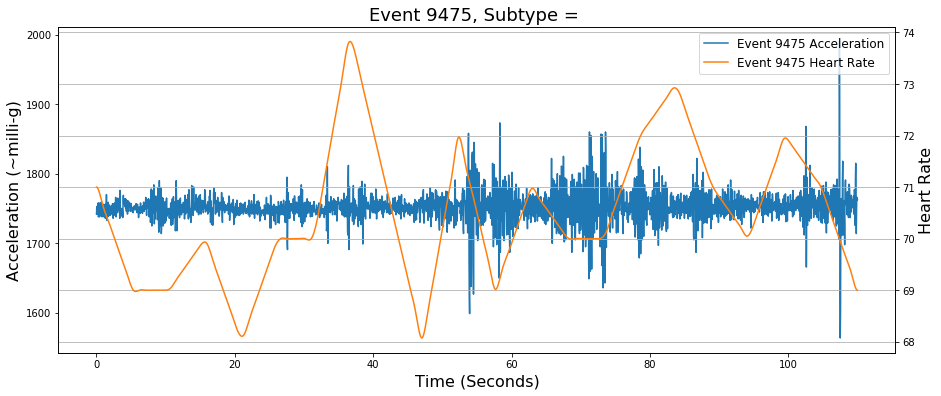

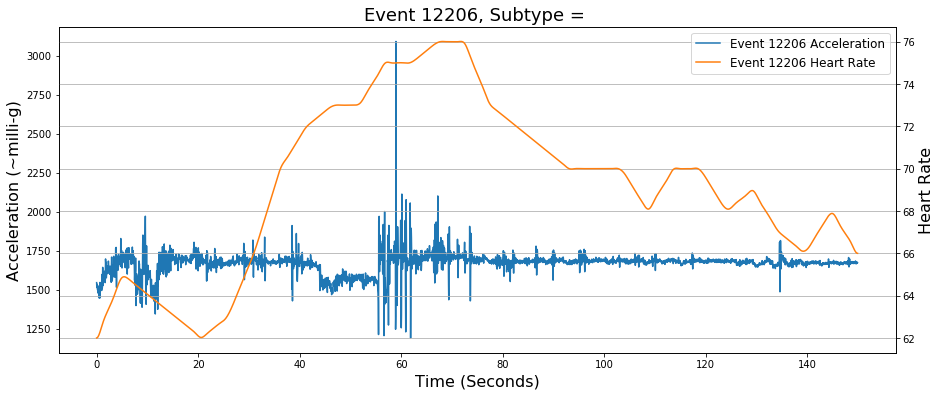

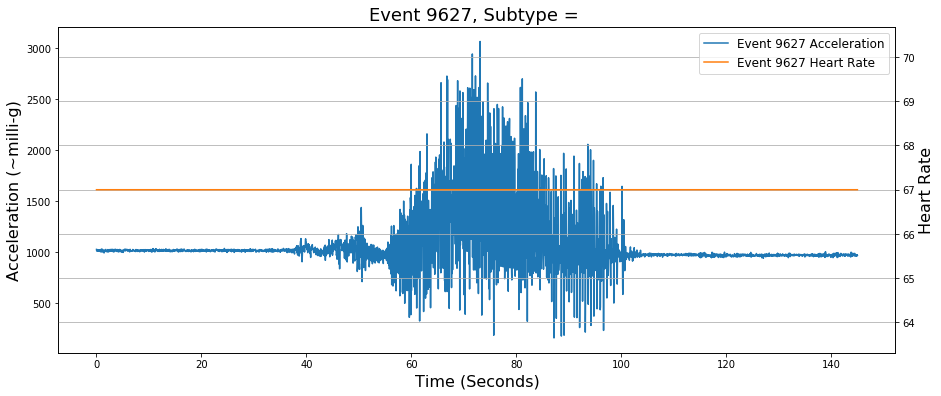

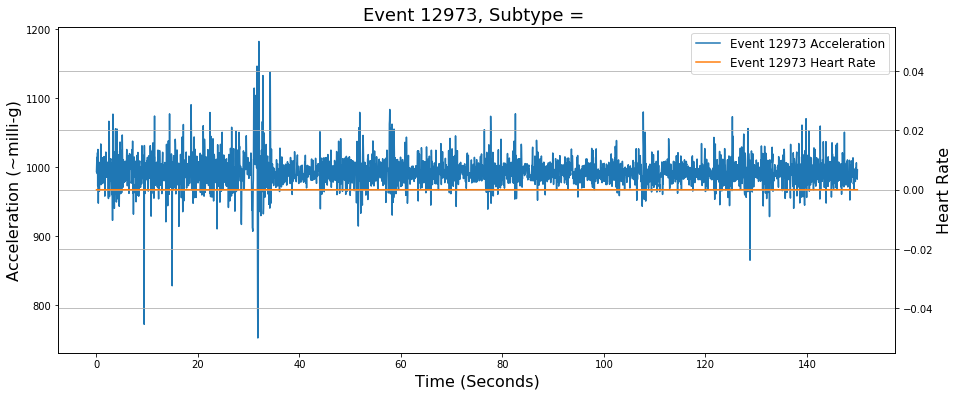

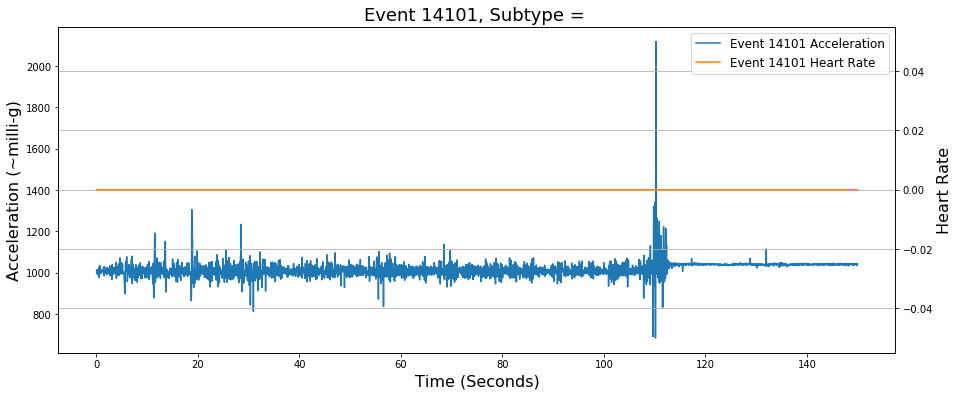

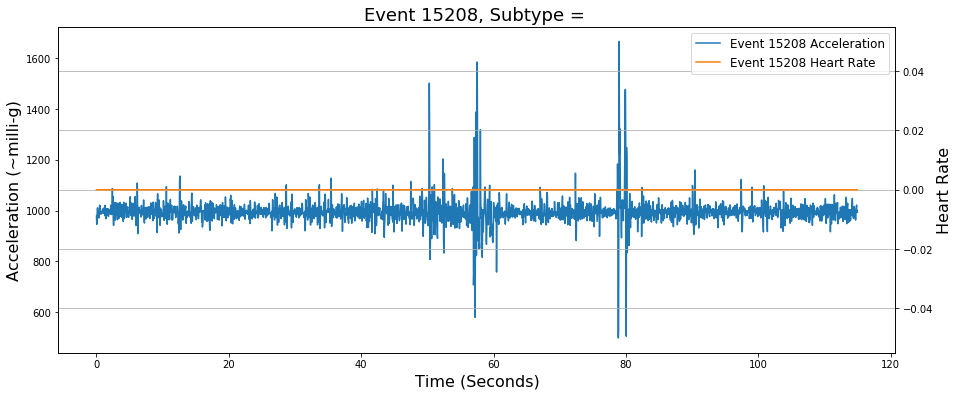

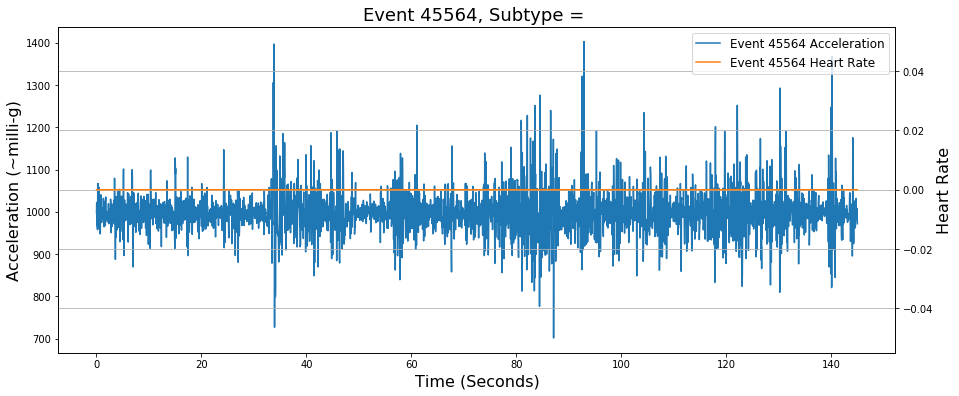

In [29]:
from scipy.interpolate import CubicSpline
from scipy.interpolate import interp1d

# Plot acceleration rawData and heart rate for each Aura eventID
for event in data:
    eventID = event['id']
    event_type = event['type']
    event_subtype = event['subType']
    
    # Check if the event subtype is "Aura"
    if event_subtype == "":
        plt.figure(figsize=(15, 6))
        ax1 = plt.gca()  # Get the current axes
        ax2 = ax1.twinx()  # Create a secondary y-axis sharing the same x-axis

        # Initialize x-axis time values and heart rate values
        time_offset = 0
        combined_data = np.array([])
        heart_rates = []

        for i, datapoint in enumerate(event['datapoints']):
            # Extract acceleration data from rawData
            acceleration_data = np.array(datapoint['rawData'])
            # Append the acceleration data to the combined data
            combined_data = np.concatenate((combined_data, acceleration_data))
            # Extract heart rate data
            heart_rate = datapoint['hr']
            heart_rates.append(heart_rate)

        # Calculate time array based on the length of combined data
        time = np.arange(len(combined_data)) / 125 * 5

        # Linearly interpolate heart rate data to generate 125 evenly spaced values
        linear_interp_hr = interp1d(np.linspace(0, 1, num=len(heart_rates)), heart_rates, kind='linear')

        # Generate new time array for interpolated data
        new_time = np.linspace(0, 1, num=125)  # 125 points for the whole sequence

        # Apply cubic spline interpolation to smooth the linearly interpolated heart rate values
        # Define the number of knots for the spline
        num_knots = 5  # Adjust this value to increase or decrease the smoothness

        # Create the cubic spline function with the specified number of knots
        cubic_spline_hr = CubicSpline(new_time, linear_interp_hr(new_time), bc_type='clamped', extrapolate=True)

        # Plot interpolated acceleration data
        ax1.plot(time, combined_data, label=f'Event {eventID} Acceleration', color='tab:blue')
        ax1.set_xlabel('Time (Seconds)', fontsize=16)
        ax1.set_ylabel('Acceleration (~milli-g)', fontsize=16)

        # Plot interpolated heart rate data on the secondary y-axis
        ax2.plot(time, cubic_spline_hr(np.linspace(0, 1, num=len(combined_data))), label=f'Event {eventID} Heart Rate', color='tab:orange')
        ax2.set_ylabel('Heart Rate', fontsize=16)

        # Combine the legends for both plots
        lines, labels = ax1.get_legend_handles_labels()
        lines2, labels2 = ax2.get_legend_handles_labels()
        ax2.legend(lines + lines2, labels + labels2, loc='upper right', fontsize=12)

        plt.title(f'Event {eventID}, Subtype = {event_subtype}', fontsize=18)
        plt.grid(True)
        plt.show()
